##**BITS F464 - Semester 1 - MACHINE LEARNING**
--------------------------------------------------------------------------------

**ASSIGNMENT 1 - LINEAR MODELS FOR REGRESSION AND CLASSIFICATION**
--------------------------------------------------------------------------------
***Team number:*** 31

---
(*In Title case, separated with commas*)
***Full names of all students in the team:***
Ajinkya Medhekar, Ashutosh Wagh, Kushal Chakraborty, S Shashank, Srinidhi P Katte
---
(*Separated by commas*)
***Id number of all students in the team:***

2022H1030099H, 2022H1030052H, 2022H1030089H, 2022H1030067H, 2022H1030075H


This assignment aims to identify the differences between three sets of Machine Learning models.

# **_1. Dataset Generation_**

You are given a sample Diabetes dataset. Using this, please develop your own dataset consisting of 500 records. You can use the given code to generate your own dataset. Submit the generated dataset as a .csv file along with your python notebook.

In [ ]:
%pip install sdv
%pip install urllib3==1.26.7
!pip install pandas
!pip install plotly==5.10.0

In [ ]:
import pandas as pd

real_data = pd.read_excel('diabetes2.xlsx')

In [ ]:
real_data.head()

In [ ]:
from sdv.metadata import SingleTableMetadata

metadata = SingleTableMetadata()

In [ ]:
metadata.detect_from_dataframe(data=real_data)

In [ ]:
metadata.visualize(
    show_table_details='summarized',
    output_filepath='my_metadata.png'
)

In [ ]:
metadata.validate()

In [ ]:
from sdv.lite import SingleTablePreset

synthesizer = SingleTablePreset(
    metadata,
    name='FAST_ML'
)

In [ ]:
synthesizer.fit(
    data=real_data
)

In [ ]:
synthetic_data = synthesizer.sample(
    num_rows=10000
)

synthetic_data.head()

In [ ]:
synthesizer.save(
    filepath='my_synthesizer.pkl'
)

In [ ]:
type(synthetic_data)

In [ ]:
synthetic_data.to_csv('Synthetic_Dataset.csv')

# ***2. Preprocess and perform exploratory data analysis of the dataset obtained***

In [1]:
#Importing required libraries
import numpy as np
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn
import random
import math
from sklearn import metrics

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
dataset=pd.read_csv('Synthetic_Dataset.csv')
dataset.head()

,Unnamed: 0,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0,7,149,96,19,10,38.387409,0.561331,40,1
1,1,0,151,44,6,105,26.125923,0.463959,27,1
2,2,3,169,57,24,240,33.224573,0.541364,36,0
3,3,4,86,61,35,0,32.918264,0.526311,39,0
4,4,6,75,62,31,77,37.453830,0.178734,21,0


In [4]:
dataset.isnull().sum()*100/dataset.shape[0]

Unnamed: 0                  0.0
Pregnancies                 0.0
Glucose                     0.0
BloodPressure               0.0
SkinThickness               0.0
Insulin                     0.0
BMI                         0.0
DiabetesPedigreeFunction    0.0
Age                         0.0
Outcome                     0.0
dtype: float64

In [5]:
dataset = dataset.drop(['Unnamed: 0'], axis=1)

In [6]:
dataset.shape

(10000, 9)

In [7]:
dataset['Outcome'].value_counts()

0    6257
1    3743
Name: Outcome, dtype: int64

In [8]:
print("the percentage of datapoints for each type of class are:")
dataset['Outcome'].value_counts() * 100 / dataset.shape[0]

the percentage of datapoints for each type of class are:


0    62.57
1    37.43
Name: Outcome, dtype: float64

In [9]:
dataset_hasdiabetes = dataset.loc[dataset['Outcome']==1]
print("Generalied statistics of patients who has diabetes")
dataset_hasdiabetes.describe()

Generalied statistics of patients who has diabetes


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,3743.000000,3743.000000,3743.000000,3743.000000,3743.000000,3743.000000,3743.000000,3743.000000,3743.0
mean,4.722415,136.331552,70.286936,22.837563,108.847181,34.278275,0.543912,36.395939,1.0
std,3.068111,29.056873,19.268614,14.827795,95.496604,7.584401,0.307474,10.655321,0.0
min,0.000000,42.000000,5.000000,0.000000,0.000000,6.892103,0.078000,21.000000,1.0
25%,2.000000,116.000000,57.000000,12.000000,19.000000,29.319186,0.305709,28.000000,1.0
50%,5.000000,136.000000,70.000000,22.000000,97.000000,34.380375,0.531265,36.000000,1.0
75%,7.000000,156.500000,83.000000,33.000000,172.000000,39.539945,0.756743,44.000000,1.0
max,17.000000,199.000000,122.000000,88.000000,477.000000,59.937412,1.587626,74.000000,1.0


In [10]:
dataset_nodiabetes = dataset.loc[dataset['Outcome']==0]
print("Generalied statistics of patients who does not have diabetes")
dataset_nodiabetes.describe()

Generalied statistics of patients who does not have diabetes


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,6257.000000,6257.000000,6257.000000,6257.000000,6257.000000,6257.000000,6257.000000,6257.000000,6257.0
mean,3.692664,112.231900,68.508710,20.488093,89.717596,30.502271,0.459104,33.094774,0.0
std,2.949381,29.465102,19.240917,14.560919,88.907911,7.584539,0.291980,9.963222,0.0
min,0.000000,13.000000,0.000000,0.000000,0.000000,2.120744,0.078000,21.000000,0.0
25%,1.000000,92.000000,55.000000,9.000000,0.000000,25.384297,0.211103,24.000000,0.0
50%,3.000000,113.000000,69.000000,20.000000,71.000000,30.623690,0.437912,32.000000,0.0
75%,6.000000,132.000000,82.000000,30.000000,148.000000,35.632404,0.657879,40.000000,0.0
max,17.000000,199.000000,122.000000,78.000000,568.000000,56.795493,1.675349,73.000000,0.0


### FacetGrid plots for all features

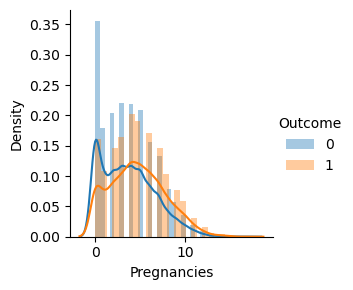

In [11]:
sn.FacetGrid(dataset,hue="Outcome")\
   .map(sn.distplot,"Pregnancies")\
   .add_legend();
plt.show()

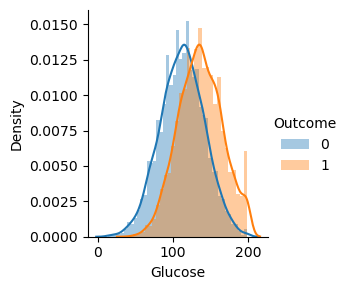

In [12]:
sn.FacetGrid(dataset,hue="Outcome")\
   .map(sn.distplot,"Glucose")\
   .add_legend();
plt.show()

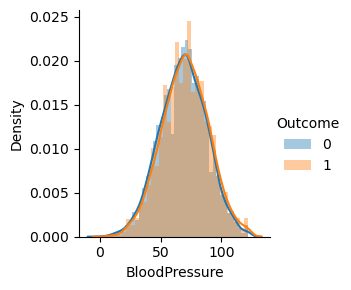

In [13]:
sn.FacetGrid(dataset,hue="Outcome")\
   .map(sn.distplot,"BloodPressure")\
   .add_legend();
plt.show()

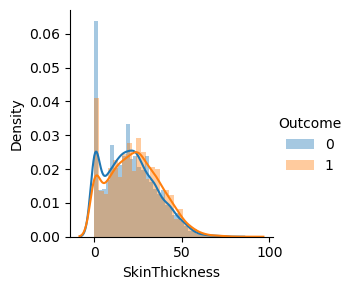

In [14]:
sn.FacetGrid(dataset,hue="Outcome")\
   .map(sn.distplot,"SkinThickness")\
   .add_legend();
plt.show()

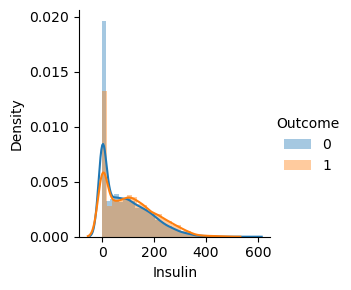

In [15]:
sn.FacetGrid(dataset,hue="Outcome")\
   .map(sn.distplot,"Insulin")\
   .add_legend();
plt.show()

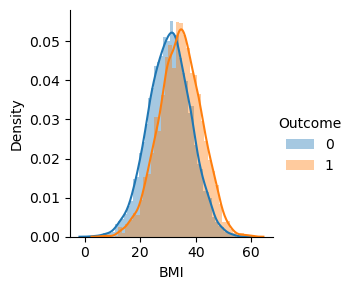

In [16]:
sn.FacetGrid(dataset,hue="Outcome")\
   .map(sn.distplot,"BMI")\
   .add_legend();
plt.show()

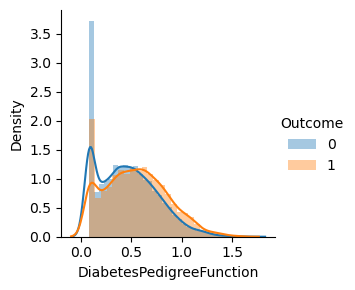

In [17]:
sn.FacetGrid(dataset,hue="Outcome")\
   .map(sn.distplot,"DiabetesPedigreeFunction")\
   .add_legend();
plt.show()

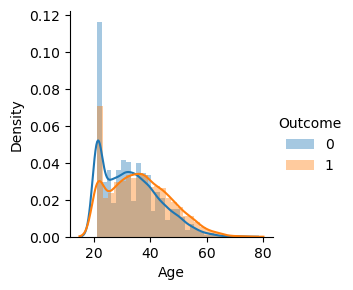

In [18]:
sn.FacetGrid(dataset,hue="Outcome")\
   .map(sn.distplot,"Age")\
   .add_legend();
plt.show()

#### Observation
**1) From the above plots, we can see that for each of the features the histograms of both the classes have intersections.**

#### Inference
**1)  None of the features when taken independently can clearly classify both the classes.**

**2) Glucose and BMI seem to be better features when compared with others. This is  because although the overlap is significant but less when compared to other features. They can be used independently to classify the datapoints to certain extent.**

In [19]:
#Normalizing the features
dataset['Pregnancies'] = (dataset['Pregnancies'] - dataset['Pregnancies'].mean()) / dataset['Pregnancies'].std()
dataset['Glucose'] = (dataset['Glucose'] - dataset['Glucose'].mean()) / dataset['Glucose'].std()
dataset['BloodPressure'] = (dataset['BloodPressure'] - dataset['BloodPressure'].mean()) / dataset['BloodPressure'].std()
dataset['SkinThickness'] = (dataset['SkinThickness'] - dataset['SkinThickness'].mean()) / dataset['SkinThickness'].std()
dataset['Insulin'] = (dataset['Insulin'] - dataset['Insulin'].mean()) / dataset['Insulin'].std()
dataset['BMI'] = (dataset['BMI'] - dataset['BMI'].mean()) / dataset['BMI'].std()
dataset['DiabetesPedigreeFunction'] = (dataset['DiabetesPedigreeFunction'] - dataset['DiabetesPedigreeFunction'].mean()) / dataset['DiabetesPedigreeFunction'].std()
dataset['Age'] = (dataset['Age'] - dataset['Age'].mean()) / dataset['Age'].std()

In [20]:
dataset.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.962604,0.879570,1.392129,-0.161003,-0.945429,0.829591,0.234419,0.547720,1
1,-1.343508,0.942968,-1.306429,-1.045076,0.088388,-0.742158,-0.089427,-0.708164,1
2,-0.355174,1.513549,-0.631789,0.179025,1.557496,0.167788,0.168011,0.161294,0
3,-0.025730,-1.117464,-0.424208,0.927087,-1.054251,0.128524,0.117946,0.451114,0
4,0.633160,-1.466152,-0.372313,0.655064,-0.216316,0.709919,-1.038049,-1.287804,0


### Pairplots of all features

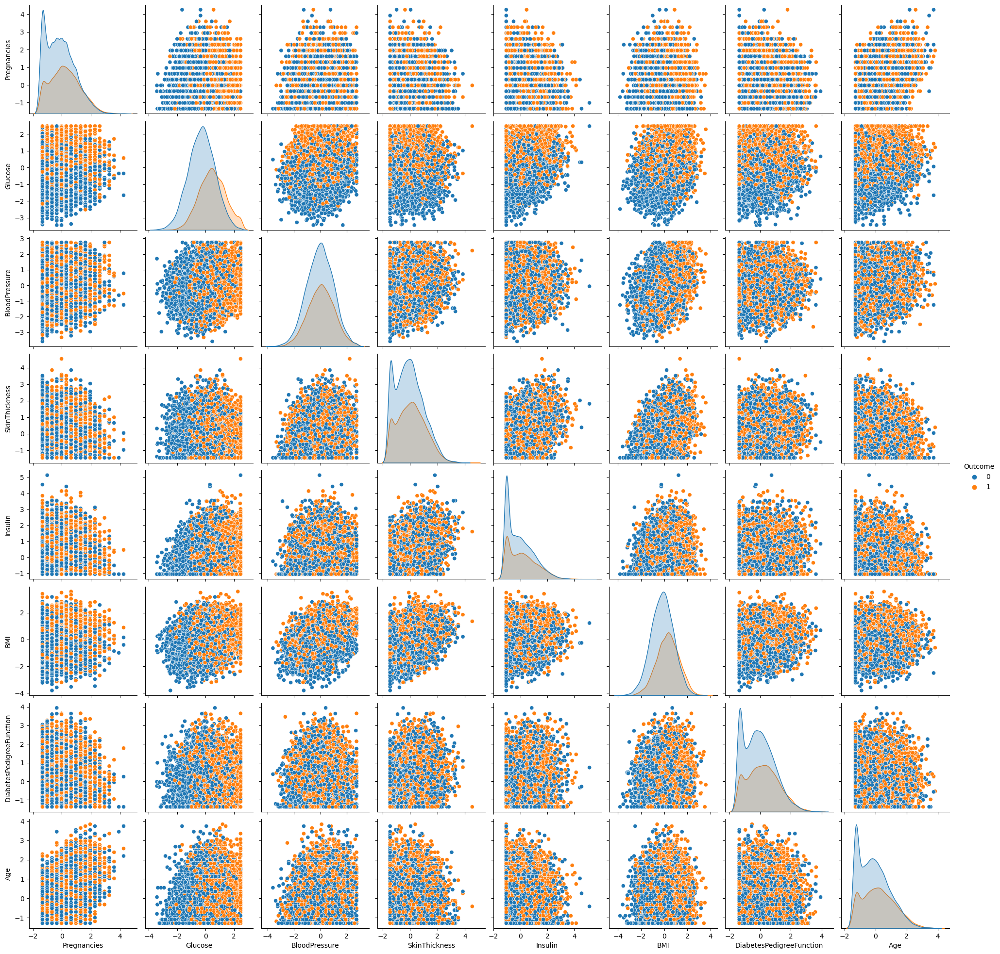

In [21]:
sn.pairplot(dataset, hue="Outcome")

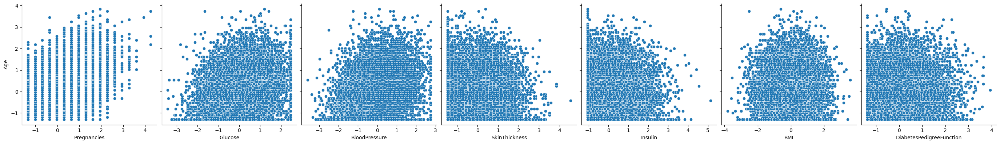

In [22]:
sn.pairplot(dataset, x_vars=['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction'], y_vars='Age', height=4, aspect=1,kind='scatter')
plt.show()

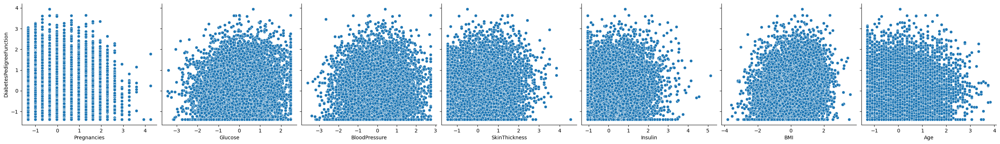

In [23]:
sn.pairplot(dataset, x_vars=['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','Age'], y_vars='DiabetesPedigreeFunction', height=4, aspect=1, kind='scatter')
plt.show()

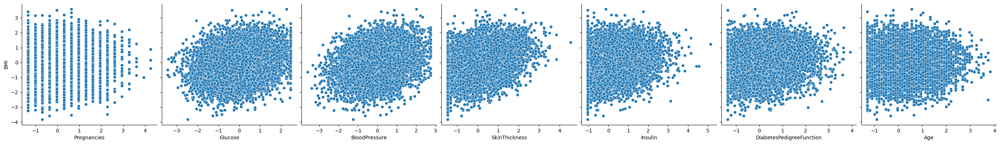

In [24]:
sn.pairplot(dataset, x_vars=['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','DiabetesPedigreeFunction','Age'], y_vars='BMI', height=4, aspect=1, kind='scatter')
plt.show()

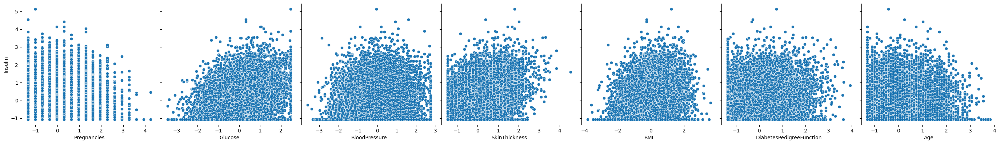

In [25]:
sn.pairplot(dataset, x_vars=['Pregnancies','Glucose','BloodPressure','SkinThickness','BMI','DiabetesPedigreeFunction','Age'], y_vars='Insulin', height=4, aspect=1, kind='scatter')
plt.show()

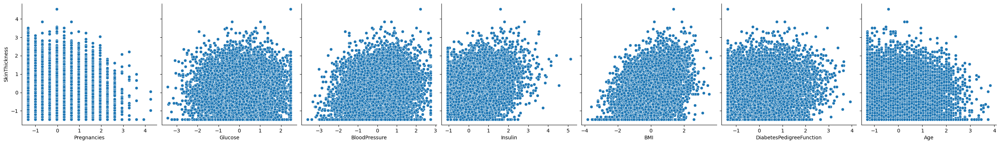

In [26]:
sn.pairplot(dataset, x_vars=['Pregnancies','Glucose','BloodPressure','Insulin','BMI','DiabetesPedigreeFunction','Age'], y_vars='SkinThickness', height=4, aspect=1, kind='scatter')
plt.show()

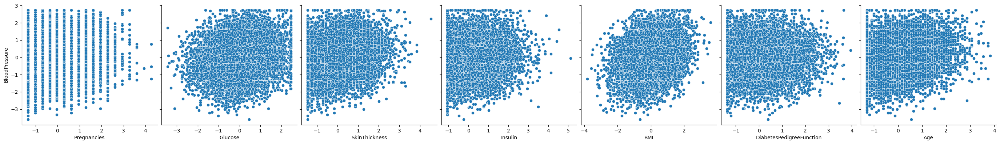

In [27]:
sn.pairplot(dataset, x_vars=['Pregnancies','Glucose','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age'], y_vars='BloodPressure', height=4, aspect=1, kind='scatter')
plt.show()

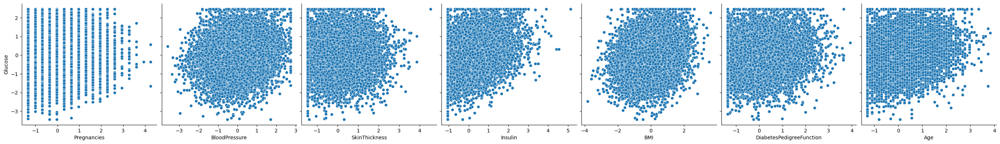

In [28]:
sn.pairplot(dataset, x_vars=['Pregnancies','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age'], y_vars='Glucose', height=4, aspect=1, kind='scatter')
plt.show()

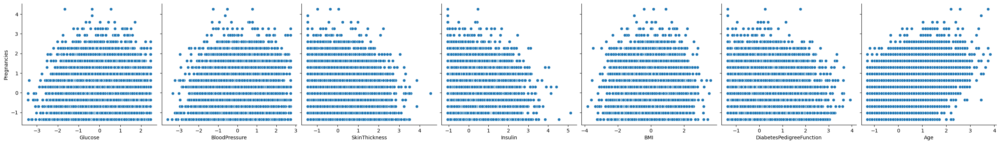

In [29]:
sn.pairplot(dataset, x_vars=['Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age'], y_vars='Pregnancies', height=4, aspect=1, kind='scatter')
plt.show()

#### Observations
**1) From the above pairplots, we can see that the data points of both classes have a significant overlap with the given features**

**2)  With various feature pairs, we can observe that the Datapoints form clusters with different shapes.**

**3) The pair plots with Pregnancies as one of the features show some kind of linear relationships as the datapoints form lines in different rows i.e for each Pregnancies value there are large number of different datapoints for the corresponding other feature.**

### Correlation Matrix



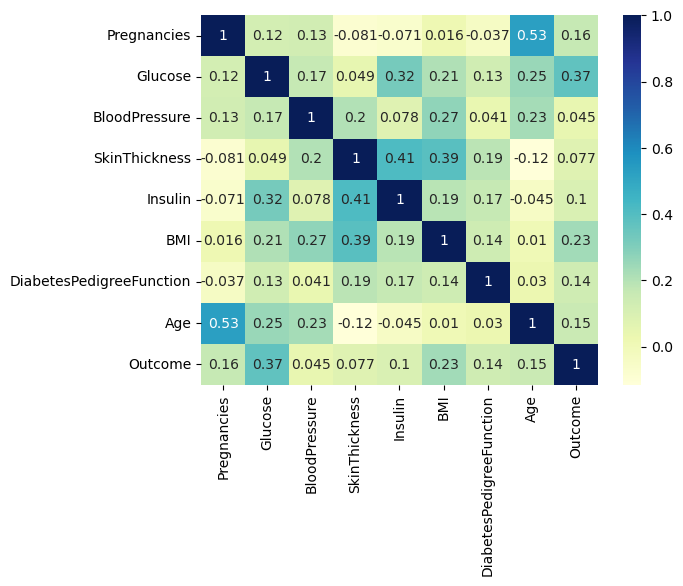

In [30]:
sn.heatmap(dataset.corr(), cmap="YlGnBu", annot = True)
plt.show()

#### Observation
**Age and Pregnancies has the maximum correlation among all pairs of features. Hence, we choose Age as X and Pregnancies as y i.e Age as the independent feature and Pregnancies as the dependent feature for the regression based experiments.**

# ***3. Comparison of Stochastic Gradient Descent and Batch Gradient Descent using Linear Regression***

## **_Stochastic Gradient Descent_**


### Using only one feature

In [31]:
X = dataset['Age']
y = dataset['Pregnancies']

In [32]:
# split train test data. Train set
# Reference : https://stackoverflow.com/questions/66618649/random-sample-from-data-frame-and-remains
dataset_train = dataset.sample(frac = 0.8)
dataset_test = dataset[~dataset.index.isin(dataset_train.index)]

In [33]:
dataset_train.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
3843,-1.343508,0.404086,-2.136754,-1.453110,1.241910,-0.815102,-1.106634,-0.418345,1
2139,-1.343508,-1.022367,-0.216627,-0.705048,-1.054251,-0.066497,0.796787,-1.287804,0
9993,0.303715,0.150494,-0.787475,-1.453110,-1.054251,-1.564595,0.272969,0.257901,0
2589,-0.684619,0.182193,0.769385,0.655064,1.666319,-0.657572,-0.737790,0.354507,0
6450,0.303715,0.784473,-1.773487,0.791075,2.156022,1.513951,0.320071,0.354507,0


In [34]:
dataset_test.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
11,0.962604,-0.324990,-0.164731,-1.045076,-1.054251,-1.443239,1.655937,1.127359,1
18,-0.684619,-1.180862,0.976966,-0.909065,-1.054251,-0.117865,0.990984,-0.611558,0
23,1.292049,1.545248,1.651606,0.247030,-0.847488,-0.026990,1.960897,1.513786,0
30,-1.343508,-0.927270,0.146641,-0.092998,-1.054251,0.762721,-0.482422,-1.287804,0
40,0.962604,-1.371056,-0.060941,-0.365020,-1.054251,0.069697,-0.963330,0.161294,0


In [35]:
#preparing train and test datasets
X_train = dataset_train['Age']
X_test = dataset_test['Age']
y_train = dataset_train['Pregnancies']
y_test = dataset_test['Pregnancies']

In [36]:
X_train_dataset = np.array(X_train)
X_test_dataset = np.array(X_test)
y_train_dataset = np.array(y_train)
y_test_dataset = np.array(y_test)

In [37]:
#initializing c and m1 at random
c = random.random()
m1 = random.random()

### Stochastic Gradient Descent Algorithm <br>
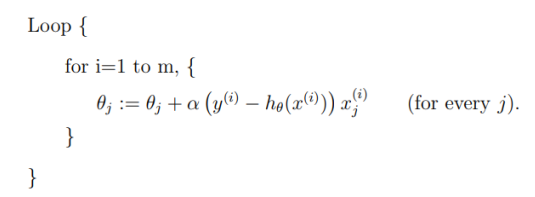

In [38]:
#implementation of stochastic gradient descent
def stochastic_gradient_descent(c, m1, X,y,alpha, iterations):
    error=[]
    n = X.shape[0]
    for i in range(iterations):
        summation=0
        for j in range(n):
            y_prediction =  c + m1 * X[j]
            summation = summation + (y[j] - y_prediction)**2
            dError_dm1 =  X[j] * (y[j] - y_prediction);
            dError_dc =  (y[j] - y_prediction);
            dError_dm1_sum = ((-2)/n) * dError_dm1;
            dError_dc_sum = ((-2)/n) * dError_dc;
            c_new = c - (alpha * dError_dc_sum);
            m1_new = m1 - (alpha * dError_dm1_sum);
            c = c_new
            m1 = m1_new
        error.append(summation * (1/n))
    return error, c , m1

In [39]:
#calculating test error
def evaluate_linear_reg(X_test, y_test, c, m1):
    return (1/X_test.shape[0])*sum(( y_test - (c + m1*X_test) )**2)

In [40]:
error, c_final, m1_final = stochastic_gradient_descent(c, m1, X_train_dataset,y_train_dataset,0.01, 200)

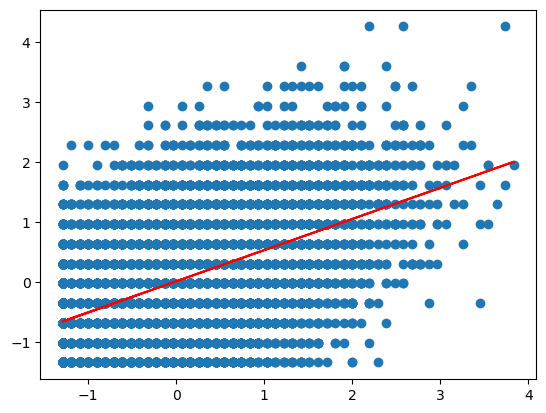

In [41]:
#plotting actual and predicted data points
plt.scatter(X_train_dataset, y_train_dataset)
plt.plot(X_train_dataset, c_final + m1_final*X_train_dataset, 'r')

In [42]:
#train and test errors
test_error = evaluate_linear_reg(X_test_dataset, y_test_dataset, c_final, m1_final)
print('Train Error : ', error[-1])
print('Test Error : ', test_error)

Train Error :  0.7218912708092755
Test Error :  0.7311419767319998


#### Observation

As train and test errors are close to each other and train error is slightly lower than test error we can infer that there is extremely minimal overfitting and the c_final and m1_final have approximately correct values according to the implemented algorithm

### Using all seven features

In [43]:
m1 = np.random.rand(8) # d+1 dimensions

In [44]:
X_train_dataset = dataset_train[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','DiabetesPedigreeFunction','Age']]
X_test_dataset = dataset_test[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','DiabetesPedigreeFunction','Age']]

In [45]:
X_train = np.array(X_train_dataset)
X_test =  np.array(X_test_dataset)

In [46]:
#implementing the stochastic GD algorithm
def stochastic_gradient_descent_all_features( m, X,y,alpha, iterations):

    n = X.shape[0]

    error = []
    for i in range(iterations):
        summation=0
        #dError_dm_sum = [0]*8;

        for j in range(n):
            x_temp = X[j]
            x_temp = np.insert(X[j], 0,1)
            y_predicted = np.dot(m.T, x_temp)
            summation = summation + (y[j] - y_predicted)**2;
            dError_dm_sum = (y[j] - y_predicted) * (x_temp);
            dError_dm = ((-2)/n) * dError_dm_sum;
            m_new = m - (alpha * dError_dm);
            m = m_new
        error.append(summation*(1/n))
    return error, m

In [47]:
#calculating test error for all features
def evaluate_linear_reg_batch(X_test, y_test, m1):
    test_error = 0
    n = X_test.shape[0]

    for i in range(n):
        x_temp = X_test[i]
        x_temp = np.insert(X_test[i], 0, 1)
        y_predict = np.dot(m1.T, x_temp)
        test_error += (y_test[i] - y_predict)**2

    return (1/n) * test_error

In [48]:
error , m_final = stochastic_gradient_descent_all_features(m1, X_train,y_train_dataset,0.01,200)

In [49]:
#train and test error
test_error = evaluate_linear_reg_batch(X_test, y_test_dataset, m_final)
print('Train Error : ', error[-1])
print('Test Error : ', test_error)

Train Error :  0.004373315126748765
Test Error :  0.004330745830671452


#### Observation

As train and test errors are close to each other and train error is slightly lower than test error we can infer that there is extremely minimal overfitting and the m_final have approximately correct values according to the implemented algorithm

## **_Batch Gradient Descent_**

### Using only one feature

In [50]:
X = dataset['Age']
y = dataset['Pregnancies']

In [51]:
# split train test data. Train set
# Reference : https://stackoverflow.com/questions/66618649/random-sample-from-data-frame-and-remains
dataset_train = dataset.sample(frac = 0.8)
dataset_test = dataset[~dataset.index.isin(dataset_train.index)]

In [52]:
dataset_train.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
5492,0.303715,-0.388388,1.028861,-0.161003,-0.205434,1.183459,-1.373079,0.934146,1
6786,1.292049,0.245591,0.613699,-0.024992,-0.629843,0.546426,0.163526,1.900212,1
8473,-0.355174,1.228258,0.042850,-0.297015,2.580431,0.918253,0.678342,0.547720,0
6445,1.292049,1.798839,0.042850,-0.229009,0.142799,0.548458,-1.373079,1.513786,1
7575,-0.684619,-0.515184,0.250431,-0.229009,-0.629843,-0.313582,-0.540366,-0.225132,0


In [53]:
dataset_test.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
4,0.633160,-1.466152,-0.372313,0.655064,-0.216316,0.709919,-1.038049,-1.287804,0
10,-0.684619,1.133161,0.976966,-1.317099,-1.054251,-0.478108,-0.321221,0.064688,0
12,0.633160,1.545248,-1.358324,-1.453110,-1.054251,-0.331624,1.849849,0.451114,1
19,0.962604,1.006366,1.236443,0.791075,0.099270,1.591421,3.069869,0.451114,1
20,1.621494,0.847871,1.807292,1.335120,2.166904,1.810937,0.649436,2.093425,1


In [54]:
#preparing train and test datasets
X_train = dataset_train['Age']
X_test = dataset_test['Age']
y_train = dataset_train['Pregnancies']
y_test = dataset_test['Pregnancies']

In [55]:
X_train_dataset = np.array(X_train)
X_test_dataset = np.array(X_test)
y_train_dataset = np.array(y_train)
y_test_dataset = np.array(y_test)

### Pregnancies = c + m1 * Age

In [56]:
#initialize c and m1 at random
c = random.random()
m1 = random.random()

In [57]:
c

0.8913664436366637

In [58]:
m1

0.7628986370291906

### Batch Gradient Descent Algorithm <br>
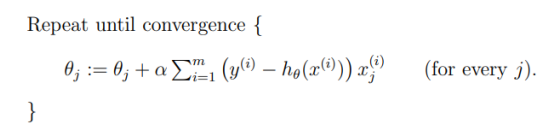

In [59]:
#implementing the batch GD algorithm
def batch_gradient_descent(c, m1, X,y,alpha, iterations):
    error = []
    n = X.shape[0]
    for i in range(iterations):
        summation = 0;
        dError_dm1_sum = 0
        dError_dc_sum = 0
        for j in range(n):
            y_predicted =  c + m1 * X[j]
            summation = summation + (y[j] - y_predicted)**2
            dError_dm1_sum = dError_dm1_sum + X[j] * (y[j] - y_predicted)
            dError_dc_sum = dError_dc_sum + (y[j] - y_predicted)
        dError_dm1 = ((-2)/n) * dError_dm1_sum
        dError_dc = ((-2)/n) * dError_dc_sum
        c_new = c - (alpha * dError_dc)
        m1_new = m1 - (alpha * dError_dm1)
        c = c_new
        m1 = m1_new
        error.append(summation*(1/n))
    return error, c , m1

In [60]:
error , c_final , m_final = batch_gradient_descent(c , m1, X_train_dataset,y_train_dataset,0.01,200)

In [61]:
c_final

0.0077667036655453305

In [62]:
m_final

0.5245582475828775

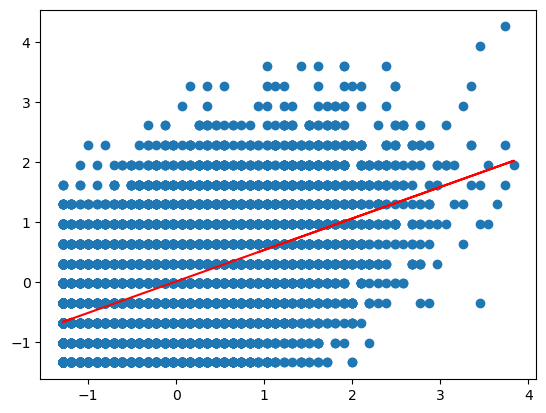

In [63]:
#plotting the actual and predicted datapoints
plt.scatter(X_train_dataset, y_train_dataset)
plt.plot(X_train_dataset, c_final + m_final*X_train_dataset, 'r')

In [64]:
#train and test errors
test_error = evaluate_linear_reg(X_test_dataset, y_test_dataset, c_final, m_final)
print('Train Error : ', error[-1])
print('Test Error : ', test_error)

Train Error :  0.7252573937370526
Test Error :  0.7173135640991598


#### Observation

As train and test errors are close to each other and train error is slightly lower than test error we can infer that there is extremely minimal overfitting and the c_final and m1_final have approximately correct values according to the implemented algorithm

### Using all the seven features

In [65]:
m1 = np.random.rand(8) # d+1 dimensions

In [66]:
m1

array([0.19255414, 0.00871929, 0.84744281, 0.02869096, 0.97696796,
       0.14593031, 0.05775828, 0.59623125])

In [67]:
X_train_dataset = dataset_train[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','DiabetesPedigreeFunction','Age']]
X_test_dataset = dataset_test[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','DiabetesPedigreeFunction','Age']]

In [68]:
X_train = np.array(X_train_dataset)
X_test =  np.array(X_test_dataset)

In [69]:
#implementing the batch GD algorithm for all features
def batch_gradient_descent_all_features( m, X,y,alpha, iterations):

    n = X.shape[0]

    error = []
    for i in range(iterations):
        summation=0
        dError_dm_sum = [0]*8;

        for j in range(n):
            x_temp = X[j]
            x_temp = np.insert(X[j], 0,1)
            y_predicted = np.dot(m.T, x_temp)
            summation = summation + (y[j] - y_predicted)**2
            dError_dm_sum = dError_dm_sum + (y[j] - y_predicted) * (x_temp)

        dError_dm = ((-2)/n) * dError_dm_sum


        m_new = m - (alpha * dError_dm)
        m = m_new
        error.append(summation*(1/n))
    return error, m

In [70]:
error , m_final = batch_gradient_descent_all_features(m1, X_train,y_train_dataset,0.01,200)

In [71]:
m_final

array([ 0.00113957,  0.88444387,  0.03787872, -0.05366733,  0.09108077,
       -0.07931914, -0.02901004,  0.12329205])

In [72]:
#train and test errors
test_error = evaluate_linear_reg_batch(X_test, y_test_dataset, m_final)
print('Train Error : ', error[-1])
print('Test Error : ', test_error)

Train Error :  0.02190396066825245
Test Error :  0.02099490740933858


#### Observation

As train and test errors are close to each other and train error is slightly lower than test error we can infer that there is extremely minimal overfitting and m_final have approximately correct values according to the implemented algorithm

## **_Insights drawn (plots, markdown explanations)_**

In [73]:
#initialize c and m1
c = random.random()
m1 = random.random()

In [74]:
c

0.3675245798483403

In [75]:
m1

0.7365530245548736

In [76]:
X_train = dataset_train['Age']
X_test = dataset_test['Age']
y_train = dataset_train['Pregnancies']
y_test = dataset_test['Pregnancies']

In [77]:
X_train_dataset = np.array(X_train)
X_test_dataset = np.array(X_test)
y_train_dataset = np.array(y_train)
y_test_dataset = np.array(y_test)

In [78]:
error_4 , c_final_4 , m_final_4 = batch_gradient_descent(c , m1, X_train_dataset,y_train_dataset,0.01,200)
error_5 , c_final_5 , m_final_5 = stochastic_gradient_descent(c , m1, X_train_dataset,y_train_dataset,0.01,200)

Text(0.5, 1.0, 'Mean Squared Error Vs. Iterations')

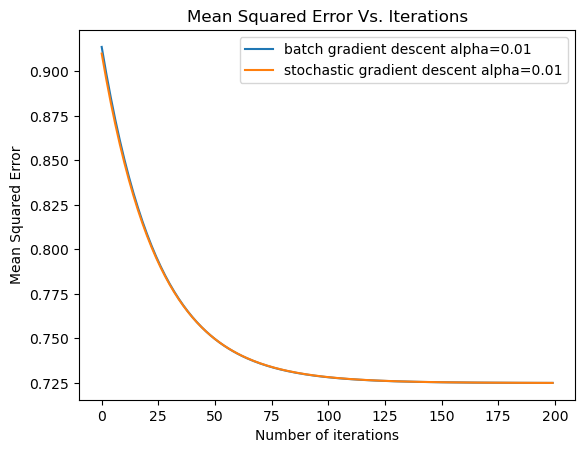

In [79]:
#plotting mse per iteration for batch and stochastic GD algorithms
plt.plot([j for j in range(200)],error_4, label="batch gradient descent alpha=0.01")
plt.plot([j for j in range(200)],error_5, label="stochastic gradient descent alpha=0.01")
plt.legend()
plt.ylabel('Mean Squared Error')
plt.xlabel('Number of iterations')
plt.title('Mean Squared Error Vs. Iterations')

#### Observation
**On close observation of the above graph, the mean square error for Stochastic GD starts decreasing at an earlier iteration than that of Batch GD. From this we infer that Stochastic GD converges faster than Batch GD.**

# **_4. Comparison of Lasso and Ridge Regression using Polynomial Regression_**

## **_Lasso Regression_**

In [80]:
#preparing train and test datasets
X_train = dataset_train['Age']
X_test = dataset_test['Age']
y_train = dataset_train['Pregnancies']
y_test = dataset_test['Pregnancies']

In [81]:
X_train_dataset = np.array(X_train)
X_test_dataset = np.array(X_test)
y_train_dataset = np.array(y_train)
y_test_dataset = np.array(y_test)

### For degree 2

In [82]:
deg=2

In [83]:
m1 = np.random.rand(deg+1)

In [84]:
m1.shape

(3,)

### Lasso Polynomial Regression Algorithm <br>

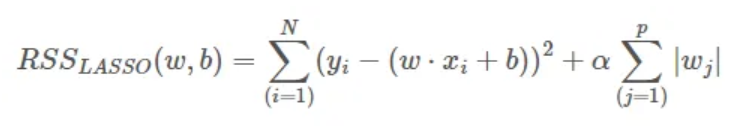

In [85]:
#implementing lasso polynomial regression algorithm
def polynomial_reg_gradient_descent(m1, X, y, X_test, y_test, alpha, deg, iterations,regularization=False, reg_type='ridge', lambda_reg=0.1):
    n = X.shape[0]
    error = []
    test_error = []

    for i in range(iterations):
        error_sum = 0
        dError_dm1 = np.zeros(deg + 1)

        for j in range(n):
            y_predicted = 0

            for k in range(deg + 1):
                y_predicted += m1[k] * (X[j] ** k)

            error_sum += (y[j] - y_predicted) ** 2

            for k in range(deg + 1):
                dError_dm1[k] += (y_predicted - y[j]) * (X[j] ** k)

        error_sum /= n
        if regularization:
            if type == 'lasso':
                error_sum += lambda_reg * sum(abs(m1[k]) for k in range(deg + 1))

                for k in range(deg + 1):
                    dError_dm1[k] += lambda_reg * np.sign(m1[k])

            elif type == 'ridge':
                error_sum += lambda_reg * sum(m1[k]**2 for k in range(deg + 1))

                for k in range(deg + 1):
                    dError_dm1[k] += 2*lambda_reg * m1[k]

        error.append(error_sum)

        for k in range(deg + 1):
            m1[k] -= alpha * (2 / n) * dError_dm1[k]

        test_error_sum = 0
        n_test = X_test.shape[0]
        for j in range(n_test):
            y_predict = 0
            for k in range(deg + 1):
                y_predict += m1[k]*(X_test[j]**k)
            test_error_sum += (y_test[j] - y_predict)**2

        test_error_sum /=n
        if regularization:
            if reg_type == 'lasso':
                test_error_sum += lambda_reg * sum( abs(m1[k]) for k in range(deg + 1))
            elif reg_type == 'ridge':
                test_error_sum += lambda_reg * sum( m1[k] ** 2 for k in range(deg + 1))
        test_error.append(test_error_sum)

    return error,test_error, m1

In [86]:
error , test_error, m_final = polynomial_reg_gradient_descent(m1, X_train_dataset,y_train_dataset,X_test_dataset,y_test_dataset,0.01,deg,200,regularization=True,reg_type='lasso')

In [87]:
#computing and storing the final predictions
prediction=[]
y_predicted = 0
for j in range(X_train_dataset.shape[0]):
        y_predicted = 0
        for k in range(deg+1):
            y_predicted += pow(X_train_dataset[j],k)*m_final[k]
        prediction.append(y_predicted)

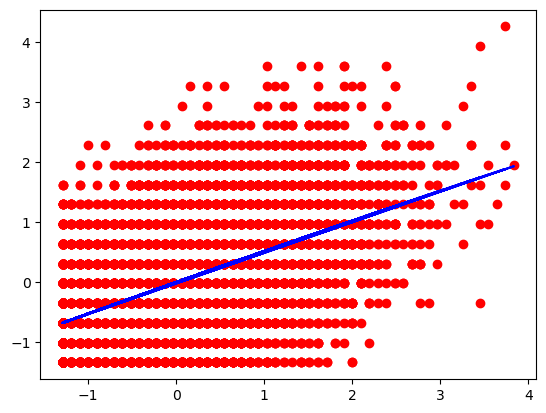

In [88]:
#plotting the actual and predicted data points
plt.scatter(X_train_dataset,y_train_dataset,color='red')
plt.plot(X_train_dataset,prediction,'b')
plt.show()

In [89]:
#train and test errors
print('Train Error : ', error[-1])
print('Test Error : ', test_error[-1])

Train Error :  0.7249358969909652
Test Error :  0.2325187137599543


### For degree 3

In [90]:
deg=3

In [91]:
m1 = np.random.rand(deg+1)

In [92]:
m1.shape

(4,)

In [93]:
#implementing lasso polynomial regression algorithm
def polynomial_reg_gradient_descent(m1, X, y, X_test, y_test, alpha, deg, iterations,regularization=False, reg_type='ridge', lambda_reg=0.1):
    n = X.shape[0]
    error = []
    test_error = []

    for i in range(iterations):
        error_sum = 0
        dError_dm1 = np.zeros(deg + 1)

        for j in range(n):
            y_predicted = 0

            for k in range(deg + 1):
                y_predicted += m1[k] * (X[j] ** k)

            error_sum += (y[j] - y_predicted) ** 2

            for k in range(deg + 1):
                dError_dm1[k] += (y_predicted - y[j]) * (X[j] ** k)

        error_sum /= n
        if regularization:
            if type == 'lasso':
                error_sum += lambda_reg * sum(abs(m1[k]) for k in range(deg + 1))

                for k in range(deg + 1):
                    dError_dm1[k] += lambda_reg * np.sign(m1[k])

            elif type == 'ridge':
                error_sum += lambda_reg * sum(m1[k]**2 for k in range(deg + 1))

                for k in range(deg + 1):
                    dError_dm1[k] += 2*lambda_reg * m1[k]

        error.append(error_sum)

        for k in range(deg + 1):
            m1[k] -= alpha * (2 / n) * dError_dm1[k]

        test_error_sum = 0
        n_test = X_test.shape[0]
        for j in range(n_test):
            y_predict = 0
            for k in range(deg + 1):
                y_predict += m1[k]*(X_test[j]**k)
            test_error_sum += (y_test[j] - y_predict)**2

        test_error_sum /=n
        if regularization:
            if reg_type == 'lasso':
                test_error_sum += lambda_reg * sum( abs(m1[k]) for k in range(deg + 1))
            elif reg_type == 'ridge':
                test_error_sum += lambda_reg * sum( m1[k] ** 2 for k in range(deg + 1))
        test_error.append(test_error_sum)

    return error,test_error, m1

In [94]:
error , test_error, m_final = polynomial_reg_gradient_descent(m1, X_train_dataset,y_train_dataset,X_test_dataset,y_test_dataset,0.01,deg,200,regularization=True,reg_type='lasso')

In [95]:
#computing and storing the final predictions
prediction=[]
y_predicted = 0
for j in range(X_train_dataset.shape[0]):
        y_predicted = 0
        for k in range(deg+1):
            y_predicted += pow(X_train_dataset[j],k)*m_final[k]
        prediction.append(y_predicted)

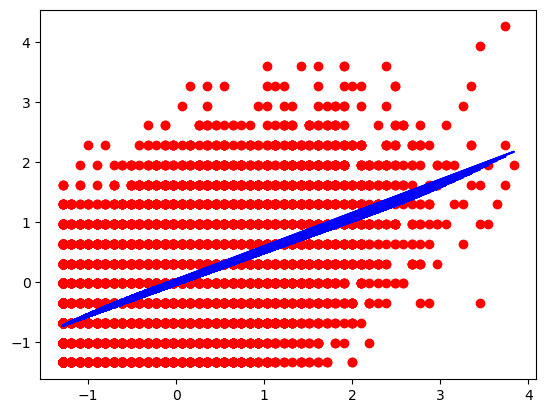

In [96]:
#plotting the actual and predicted data points
plt.scatter(X_train_dataset,y_train_dataset,color='red')
plt.plot(X_train_dataset,prediction,'b')
plt.show()

In [97]:
#train and test errors
print('Train Error : ', error[-1])
print('Test Error : ', test_error[-1])

Train Error :  0.7249117064524602
Test Error :  0.23960485668665016


## **_Ridge Regression_**

In [98]:
#preparing train and test datasets
X_train = dataset_train['Age']
X_test = dataset_test['Age']
y_train = dataset_train['Pregnancies']
y_test = dataset_test['Pregnancies']

In [99]:
X_train_dataset = np.array(X_train)
X_test_dataset = np.array(X_test)
y_train_dataset = np.array(y_train)
y_test_dataset = np.array(y_test)

### For degree 2

In [100]:
deg=2

In [101]:
m1 = np.random.rand(deg+1)

In [102]:
m1.shape

(3,)

### Ridge Ploynomial Regression Algorithm <br>

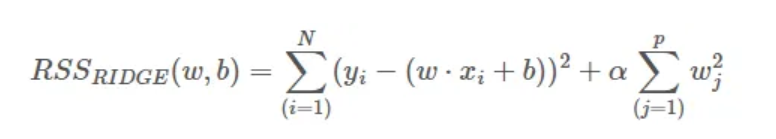

In [103]:
#implementing ridge polynomial regression algorithm
def polynomial_reg_gradient_descent(m1, X, y, X_test, y_test, alpha, deg, iterations,regularization=False, reg_type='ridge', lambda_reg=0.1):
    n = X.shape[0]
    error = []
    test_error = []

    for i in range(iterations):
        error_sum = 0
        dError_dm1 = np.zeros(deg + 1)

        for j in range(n):
            y_predicted = 0

            for k in range(deg + 1):
                y_predicted += m1[k] * (X[j] ** k)

            error_sum += (y[j] - y_predicted) ** 2

            for k in range(deg + 1):
                dError_dm1[k] += (y_predicted - y[j]) * (X[j] ** k)

        error_sum /= n
        if regularization:
            if type == 'lasso':
                error_sum += lambda_reg * sum(abs(m1[k]) for k in range(deg + 1))

                for k in range(deg + 1):
                    dError_dm1[k] += lambda_reg * np.sign(m1[k])

            elif type == 'ridge':
                error_sum += lambda_reg * sum(m1[k]**2 for k in range(deg + 1))

                for k in range(deg + 1):
                    dError_dm1[k] += 2*lambda_reg * m1[k]

        error.append(error_sum)

        for k in range(deg + 1):
            m1[k] -= alpha * (2 / n) * dError_dm1[k]

        test_error_sum = 0
        n_test = X_test.shape[0]
        for j in range(n_test):
            y_predict = 0
            for k in range(deg + 1):
                y_predict += m1[k]*(X_test[j]**k)
            test_error_sum += (y_test[j] - y_predict)**2

        test_error_sum /=n
        if regularization:
            if reg_type == 'lasso':
                test_error_sum += lambda_reg * sum( abs(m1[k]) for k in range(deg + 1))
            elif reg_type == 'ridge':
                test_error_sum += lambda_reg * sum( m1[k] ** 2 for k in range(deg + 1))
        test_error.append(test_error_sum)

    return error,test_error, m1

In [104]:
error , test_error, m_final = polynomial_reg_gradient_descent(m1, X_train_dataset,y_train_dataset, X_test_dataset, y_test_dataset,0.01,deg,200,regularization=True)

In [105]:
#computing and storing the final predictions
prediction=[]
y_predicted = 0
for j in range(X_train_dataset.shape[0]):
        y_predicted = 0
        for k in range(deg+1):
            y_predicted += pow(X_train_dataset[j],k)*m_final[k]
        prediction.append(y_predicted)

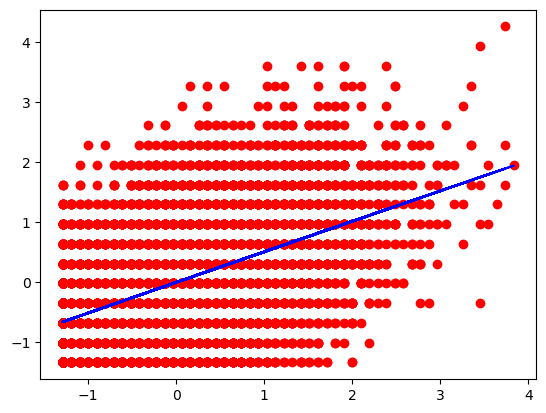

In [106]:
#plotting actual and predicted datapoints
plt.scatter(X_train_dataset,y_train_dataset,color='red')
plt.plot(X_train_dataset,prediction,'b')
plt.show()

In [107]:
#train and test errors
print('Train Error : ', error[-1])
print('Test Error : ', test_error[-1])

Train Error :  0.7250712145507002
Test Error :  0.2058897846969897


### For degree 3

In [108]:
deg=3

In [109]:
m1 = np.random.rand(deg+1)

In [110]:
m1.shape

(4,)

In [111]:
#implementing ridge polynomial regression algorithm
def polynomial_reg_gradient_descent(m1, X, y, X_test, y_test, alpha, deg, iterations,regularization=False, reg_type='ridge', lambda_reg=0.1):
    n = X.shape[0]
    error = []
    test_error = []

    for i in range(iterations):
        error_sum = 0
        dError_dm1 = np.zeros(deg + 1)

        for j in range(n):
            y_predicted = 0

            for k in range(deg + 1):
                y_predicted += m1[k] * (X[j] ** k)

            error_sum += (y[j] - y_predicted) ** 2

            for k in range(deg + 1):
                dError_dm1[k] += (y_predicted - y[j]) * (X[j] ** k)

        error_sum /= n
        if regularization:
            if type == 'lasso':
                error_sum += lambda_reg * sum(abs(m1[k]) for k in range(deg + 1))

                for k in range(deg + 1):
                    dError_dm1[k] += lambda_reg * np.sign(m1[k])

            elif type == 'ridge':
                error_sum += lambda_reg * sum(m1[k]**2 for k in range(deg + 1))

                for k in range(deg + 1):
                    dError_dm1[k] += 2*lambda_reg * m1[k]

        error.append(error_sum)

        for k in range(deg + 1):
            m1[k] -= alpha * (2 / n) * dError_dm1[k]

        test_error_sum = 0
        n_test = X_test.shape[0]
        for j in range(n_test):
            y_predict = 0
            for k in range(deg + 1):
                y_predict += m1[k]*(X_test[j]**k)
            test_error_sum += (y_test[j] - y_predict)**2

        test_error_sum /=n
        if regularization:
            if reg_type == 'lasso':
                test_error_sum += lambda_reg * sum( abs(m1[k]) for k in range(deg + 1))
            elif reg_type == 'ridge':
                test_error_sum += lambda_reg * sum( m1[k] ** 2 for k in range(deg + 1))
        test_error.append(test_error_sum)

    return error,test_error, m1

In [112]:
error , test_error, m_final = polynomial_reg_gradient_descent(m1, X_train_dataset,y_train_dataset, X_test_dataset, y_test_dataset,0.01,deg,200,regularization=True)

In [113]:
#computing and storing the final predictions
prediction=[]
y_predicted = 0
for j in range(X_train_dataset.shape[0]):
        y_predicted = 0
        for k in range(deg+1):
            y_predicted += pow(X_train_dataset[j],k)*m_final[k]
        prediction.append(y_predicted)

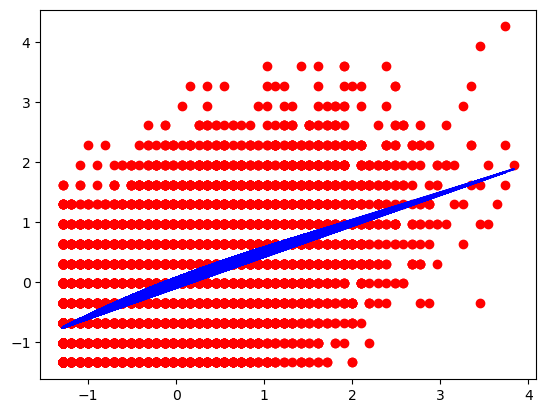

In [114]:
#plotting actual and predicted datapoints
plt.scatter(X_train_dataset,y_train_dataset,color='red')
plt.plot(X_train_dataset,prediction,'b')
plt.show()

In [115]:
#train and test errors
print('Train Error : ', error[-1])
print('Test Error : ', test_error[-1])

Train Error :  0.7277446682436769
Test Error :  0.21004591891945107


## **_Insights drawn (plots, markdown explanations)_**

Text(0.5, 1.0, 'Mean Squared Error Vs. Iterations for Ridge and Lasso')

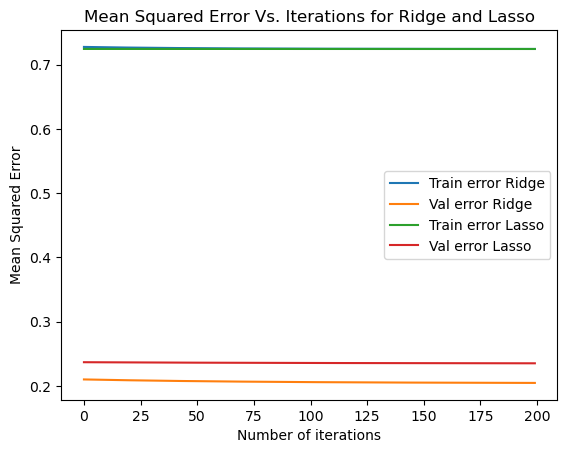

In [116]:
#plotting train and test mse per iteration for ridge and lasso polynomial regression algorithms
error , test_error, m_final = polynomial_reg_gradient_descent(m1, X_train_dataset,y_train_dataset, X_test_dataset, y_test_dataset,0.01,deg,200,regularization=True)
plt.plot([j for j in range(200)],error, label="Train error Ridge")
plt.plot([j for j in range(200)],test_error, label="Val error Ridge")

error , test_error, m_final = polynomial_reg_gradient_descent(m1, X_train_dataset,y_train_dataset,X_test_dataset,y_test_dataset,0.01,deg,200,regularization=True,reg_type='lasso')
plt.plot([j for j in range(200)],error, label="Train error Lasso")
plt.plot([j for j in range(200)],test_error, label="Val error Lasso")

plt.legend()
plt.ylabel('Mean Squared Error')
plt.xlabel('Number of iterations')
plt.title('Mean Squared Error Vs. Iterations for Ridge and Lasso')

#### Observation
**Polynomial and linear Regression expects to have linear or polynomial relationship between the features. As observed in pair plots of EDA, there is no linear relationship between various feature pairs except when Pregnancies is used as one of the features. Due to the inherent nature of the dataset we are getting the above graph for ridge and lasso polynomial regression. We are observing overfitting even if regularization is used. This may be due to the inherent nature of the dataset.**


# **_5. Comparison of Logistic Regression and Least Squares Classification_**

## **_Logistic Regression_**

In [117]:
# split train test data. Train set
# Reference : https://stackoverflow.com/questions/66618649/random-sample-from-data-frame-and-remains
dataset_train = dataset.sample(frac = 0.8)
dataset_test = dataset[~dataset.index.isin(dataset_train.index)]

In [118]:
dataset_train.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
9336,0.303715,1.006366,-1.410220,-0.569037,1.666319,1.430818,0.928890,-0.128525,1
9558,-1.343508,-0.388388,-0.995057,-0.092998,-1.054251,-1.239976,-1.373079,-1.287804,0
7448,0.633160,0.435784,0.821280,-0.297015,-0.488373,0.475006,1.049292,1.706999,1
9439,2.280383,1.576947,1.495920,0.859081,1.361615,0.489066,-1.215308,0.547720,0
2993,-0.025730,0.404086,0.925071,0.519053,-0.978076,1.143348,1.463389,1.610392,1


In [119]:
#preparing train and test datasets
X_train = dataset_train[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']]
y_train = dataset_train['Outcome']
X_test = dataset_test[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']]
y_test = dataset_test['Outcome']

In [120]:
X_train_dataset = np.array(X_train)
X_test_dataset = np.array(X_test)
y_train_dataset = np.array(y_train)
y_test_dataset = np.array(y_test)

In [121]:
X_train_dataset.shape

(8000, 8)

In [122]:
# Initialization of parameters
w = np.random.rand(X_train_dataset.shape[1]+1)

In [123]:
w

array([0.21098525, 0.41712338, 0.73872799, 0.25596659, 0.22904123,
       0.04072872, 0.16936618, 0.36238049, 0.39663442])

### Logistic Regression Algorithm <br>

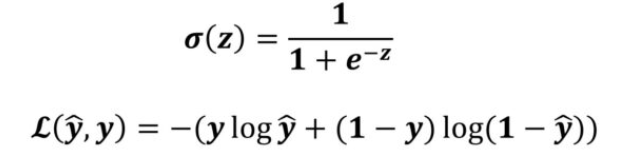

In [124]:
#implementing logistic regression algorithm
def gradient_descent_logistic(X,y,w,alpha,iterations):
    error=[]
    n = X.shape[0]
    for i in range(iterations):
        summation=0;
        dError_dw_sum = np.array([0]*9);
        for j in range(n):
            x_temp = np.insert(X[j],0,1);
            sigmoid_activation_value = 1 / (1 + pow(math.e,(-1) * np.dot(w.T,x_temp)));
            y_pred = sigmoid_activation_value
            summation = summation + (-(y[j])* math.log(y_pred) - (1 - y[j]) * math.log(1 - y_pred));
            dError_dw_sum = dError_dw_sum  + (sigmoid_activation_value - y[j]) * x_temp;
        dError_dw = (1/n)* dError_dw_sum
        w_new = w - alpha * dError_dw;
        w = w_new
        error.append((1/n) * summation)
    return w , error

In [125]:
w_final, error_final = gradient_descent_logistic(X_train_dataset, y_train_dataset, w, 0.01, 1000 )

In [126]:
#final weight vector
w_final

array([-0.50786152,  0.26756389,  0.75642835, -0.14424381,  0.11386906,
       -0.07802771,  0.31744785,  0.19618384,  0.10408885])

In [127]:
#predicting outcomes based on dataset and weights
def predict_lr(X,w):
    n = X.shape[0]
    result=[]
    for j in range(n):
        y_pred = x_temp = np.insert(X[j],0,1);
        sigmoid_activation_value = 1 / (1 + pow(math.e,(-1) * np.dot(w.T,x_temp)));
        y_pred = sigmoid_activation_value
        if y_pred >=0.5:
            result.append(1)
        else:
            result.append(0)
    return result

In [128]:
#computing F1 score
def F1_score(y_test,y_pred):
    true_pos,true_neg,false_pos,false_neg = 0,0,0,0
    for i in range(len(y_test)):
        if y_test[i] == 1 and y_pred[i] == 1:
            true_pos += 1
        elif y_test[i] == 1 and y_pred[i] == 0:
            false_neg += 1
        elif y_test[i] == 0 and y_pred[i] == 1:
            false_pos += 1
        elif y_test[i] == 0 and y_pred[i] == 0:
            true_neg += 1
    precision = true_pos/(true_pos+false_pos)
    recall = true_pos/(true_pos+false_neg)
    f1_score = 2*precision*recall/(precision+recall)
    return f1_score

In [129]:
X_test_dataset.shape

(2000, 8)

In [130]:
y_pred = predict_lr(X_test_dataset,w_final)

In [131]:
#F1 score
F1_score(y_test_dataset,y_pred)

0.5531295487627366

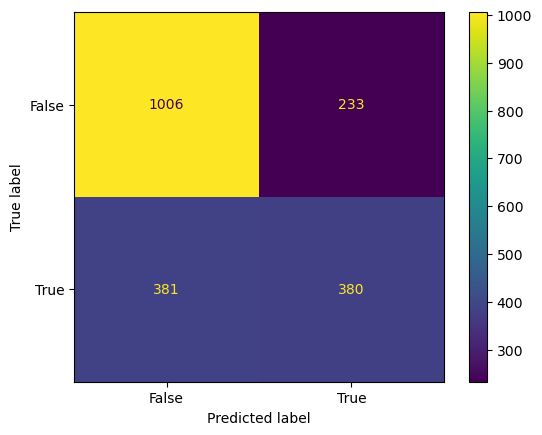

In [132]:
#plotting the confusion matrix
confusion_matrix = metrics.confusion_matrix(y_test_dataset, y_pred)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot()
plt.show()

#### Observation

**1) The F1 score is above 0.5 and closer to 1.**

**2) In confusion matrix the major diagonal values are greater than minor diagonal values.**

#### Inference
**From the observations we can infer that the model is able to correctly classify the majority of the datapoints.**

## **_Least Squares Classification_**

In [133]:
#preparing the train and test datasets
X_train = dataset_train[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']]
y_train = dataset_train['Outcome']
X_test = dataset_test[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']]
y_test = dataset_test['Outcome']

In [134]:
X_train_dataset = np.array(X_train)
X_test_dataset = np.array(X_test)
y_train_dataset = np.array(y_train)
y_test_dataset = np.array(y_test)

In [135]:
y_train_dataset

array([1, 0, 1, ..., 1, 1, 0], dtype=int64)

In [136]:
#Convert labels to vectorized form
def convert_label(y):
    result=[]
    row=[]
    n = y.shape[0]
    no_of_unique_val = len(np.unique(y))
    for i in range(n):
        row = []
        for j in range(no_of_unique_val):
            if y[i]==j:
                row.append(1)
            else:
                row.append(0)
        result.append(row)
    return result


In [137]:
#converting y_train label to vector
y_train_labelvector = np.array(convert_label(y_train_dataset))

In [138]:
#converting y_test label to vector
y_test_labelvector = np.array(convert_label(y_test_dataset))

### Least Squares Classification Algorithm <br>

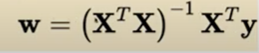

In [139]:
#implementing the least squares classification algorithm
temp = np.matmul(X_train_dataset.T,X_train_dataset);
temp1 = np.linalg.inv(temp)
temp2 = np.matmul(temp1,X_train_dataset.T)
w_optimized = np.matmul(temp2,y_train_labelvector)

In [140]:
#final weight vector
w_optimized

array([[-0.05991919,  0.05825864],
       [-0.15856267,  0.16335284],
       [ 0.0481172 , -0.0417217 ],
       [-0.01715912,  0.02185656],
       [ 0.01904314, -0.02272022],
       [-0.08491091,  0.07514595],
       [-0.03710122,  0.0327316 ],
       [-0.01724745,  0.01223572]])

In [141]:
#predicting outcomes based on dataset and weight vector
def predict_ls(X,w):

    n = X.shape[0]
    final=[]
    classtmp=0;
    for i in range(n):
        result = float('-inf')
        for j in range(w.shape[1]):
            w_temp=[]
            for k in range(w.shape[0]):
                w_temp.append(w[k][j]);
            tmp = np.dot(np.array(w_temp).T,X[i])
            if tmp > result:
                result=tmp
                classtmp = j
        final.append(classtmp)
    return final

In [142]:
y_pred = predict_ls(X_test_dataset,w_optimized)

In [143]:
y_test_dataset

array([1, 1, 0, ..., 0, 1, 1], dtype=int64)

In [144]:
#F1 score
F1_score(y_test_dataset,y_pred)

0.6287663445139284

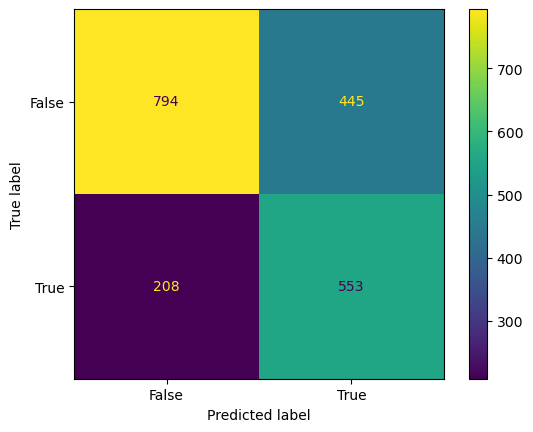

In [145]:
#plotting the confusion matrix
confusion_matrix = metrics.confusion_matrix(y_test_dataset, y_pred)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot()
plt.show()

#### Observation

**1) The F1 score is above 0.5 and closer to 1.**

**2) In confusion matrix the major diagonal values are greater than minor diagonal values.**

#### Inference
**From the observations we can infer that the model is able to correctly classify the majority of the datapoints.**

## **_Insights drawn (plots, markdown explanations)_**

In [146]:
X_train = dataset_train[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']]
y_train = dataset_train['Outcome']
X_test = dataset_test[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']]
y_test = dataset_test['Outcome']

In [147]:
X_train_dataset = np.array(X_train)
X_test_dataset = np.array(X_test)
y_train_dataset = np.array(y_train)
y_test_dataset = np.array(y_test)

In [148]:
y_pred = predict_lr(X_test_dataset,w_final)

In [149]:
F1_score(y_test_dataset,y_pred)

0.5531295487627366

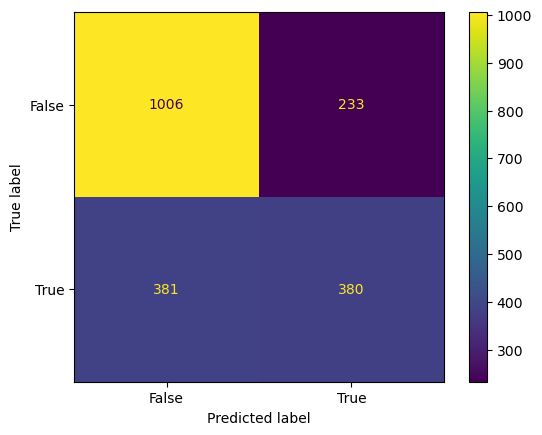

In [150]:
confusion_matrix = metrics.confusion_matrix(y_test_dataset, y_pred)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot()
plt.show()

In [151]:
y_pred = predict_ls(X_test_dataset,w_optimized)

In [152]:
F1_score(y_test_dataset,y_pred)

0.6287663445139284

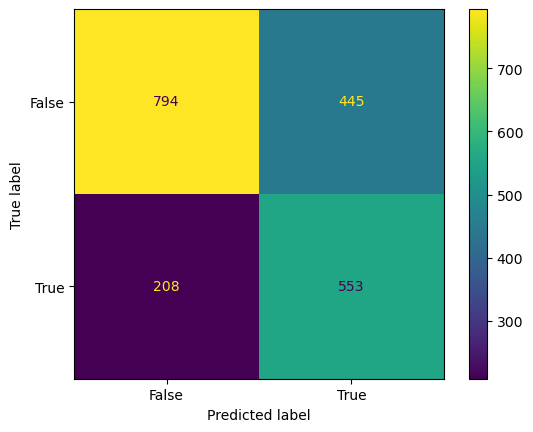

In [153]:
confusion_matrix = metrics.confusion_matrix(y_test_dataset, y_pred)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot()
plt.show()

#### Observation and Inference
1. **F1 score of Logistic Regression is 0.62. From this we infer that even with the imbalanced dataset the model is able to classify the datapoints towards a higher F1 score.**
2. **F1 score of Least Squares Classification is 0.66. From this we infer that even with the imbalanced dataset the model is able to classify the datapoints towards a higher F1 score.**
3. **Both the classification models work fairly well at classifying the datapoints.**
4. **By taking into consideration the main diagonal of the confusion matrix, we find that the least square classification model works better at classifying the given datapoints than logistic regression model.**


# **_5. References_**

1.   [Bishop, Christopher M. Pattern Recognition and Machine Learning. New York :Springer, 2006.](https://www.microsoft.com/en-us/research/uploads/prod/2006/01/Bishop-Pattern-Recognition-and-Machine-Learning-2006.pdf)
2.   https://stackoverflow.com/questions/66618649/random-sample-from-data-frame-and-remains
3. https://www.analyticsvidhya.com/blog/2021/07/an-introduction-to-logistic-regression/
4. https://study.iitm.ac.in/ds/course_pages/BSCS2007.html
5. [Machine Learning Techniques](https://www.youtube.com/playlist?list=PLZ2ps__7DhBbim4oKfdSdOpLyUwNd8UQL)
6. [CS229 Lecture Notes by Andrew Ng and Tengyu Ma](https://sgfin.github.io/files/notes/CS229_Lecture_Notes.pdf)

